# Milestone 2  Phase 2: Computer Vision with Tensorflow

by: Naomi Amelia

# Overview and Objective

The dataset that I have chosen is flower dataset and it is aimed to make image prediction regarding selected types of flowers such as `rose, dandelion, tulip, daisy and sunflower`.

The prediction model will be performed by using Tensorflow.


# Importing Libraries

In this section, I will be importing libraries that will be used for the means of visualisizing, preprocessing and modelling.

In [38]:
import os
import gc
import re
import glob
from PIL import Image


import cv2
import math
import numpy as np
import scipy as sp
import pandas as pd

import tensorflow as tf
from IPython.display import SVG
from keras.utils import plot_model
import tensorflow.keras.layers as layers
from keras.utils import model_to_dot
import tensorflow.keras.backend as K
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array, array_to_img
import tensorflow as tf 
from tensorflow.keras.layers import Flatten, Conv2D, Activation, Dense, Dropout, MaxPooling2D
import matplotlib.image as mpimg
from tensorflow.keras.callbacks import EarlyStopping

import seaborn as sns
from tqdm import tqdm
import matplotlib.cm as cm
from sklearn import metrics
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve,roc_auc_score,precision_score, recall_score, confusion_matrix, classification_report, accuracy_score, f1_score, ConfusionMatrixDisplay


tqdm.pandas()
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

np.random.seed(0)
tf.random.set_seed(0)

import warnings
warnings.filterwarnings("ignore")

# Data Loading

In this section, I will be loading the data from the google drive 

In [39]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
main_path='/content/drive/MyDrive/flowers'

In [4]:
labels=os.listdir('/content/drive/MyDrive/flowers')
labels

['rose', 'dandelion', 'tulip', 'daisy', 'sunflower']

In [5]:
print('image set: \n' + '='*50)
num_tulip= len(os.listdir(os.path.join(main_path, 'tulip')))
num_sunflower= len(os.listdir(os.path.join(main_path, 'sunflower')))
num_rose= len(os.listdir(os.path.join(main_path, 'rose')))
num_dandelion= len(os.listdir(os.path.join(main_path, 'dandelion')))
num_daisy= len(os.listdir(os.path.join(main_path, 'daisy')))


print(f'tulip ammount= {num_tulip}')
print(f'sunflower ammount= {num_sunflower}')
print(f'rose ammount= {num_rose}')
print(f'dandelion ammount= {num_dandelion}')
print(f'daisy ammount= {num_daisy}')


image set: 
tulip ammount= 2294
sunflower ammount= 733
rose ammount= 784
dandelion ammount= 1052
daisy ammount= 764


In [6]:
main_tulip = glob.glob(main_path+"/tulip/*.jpg")
main_sunflower = glob.glob(main_path+"/sunflower/*.jpg")
main_rose = glob.glob(main_path+"/rose/*.jpg")
main_dandelion = glob.glob(main_path+"/dandelion/*.jpg")
main_daisy = glob.glob(main_path+"/daisy/*.jpg")


In [7]:
# Defining dataframe function
def create_dataframe(list_of_images):
    data = []
    for image in list_of_images:
        data.append((image, image.split('/')[5].split('\\')[0]))
    return pd.DataFrame(data, columns=['images', 'label'])

# creating dataframe
df= create_dataframe(main_tulip + main_sunflower + main_rose + main_dandelion + main_daisy)
df= df.sample(frac=1, random_state=19).reset_index(drop=True)

df.head()

,images,label
0,/content/drive/MyDrive/flowers/dandelion/34689...,dandelion
1,/content/drive/MyDrive/flowers/tulip/343326572...,tulip
2,/content/drive/MyDrive/flowers/daisy/861668407...,daisy
3,/content/drive/MyDrive/flowers/tulip/704269284...,tulip
4,/content/drive/MyDrive/flowers/daisy/719122149...,daisy


# Exploratory Data Analysis

To understand the dataset better, this section will be used to visualize the labels.

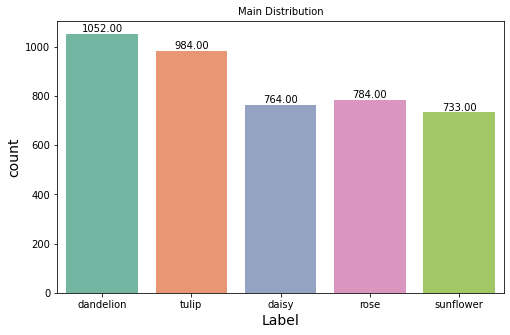

In [8]:
# defining plot function
def visualize_data(dataframe, label):
    fig, ax = plt.subplots(figsize =(8, 5))
    ax = sns.countplot(x='label', data=dataframe, palette='Set2')
    ax.set_title('Data Distribution')
    ax.set_xlabel('Label')
    ax.set_ylabel('Count')
    for p in ax.patches:
        ax.annotate(format(p.get_height(), '.2f'),
                   (p.get_x() + p.get_width() / 2,
                    p.get_height()), ha='center', va='center',
                   size=10, xytext=(0, 5),
                   textcoords='offset points')
    
    # Setting the label for x-axis
    plt.xlabel("Label", size=14)
    # Setting the label for y-axis
    plt.ylabel("count", size=14)
    # plt title base on name of 
    plt.title(f"{label} Distribution", size=10)
    plt.show()

visualize_data(df, 'Main')

From this barplot, we can see that the distribution of the flowers are balanced with dandelion holds the most amount, followed by tulip, rose, daisy and sunflower.

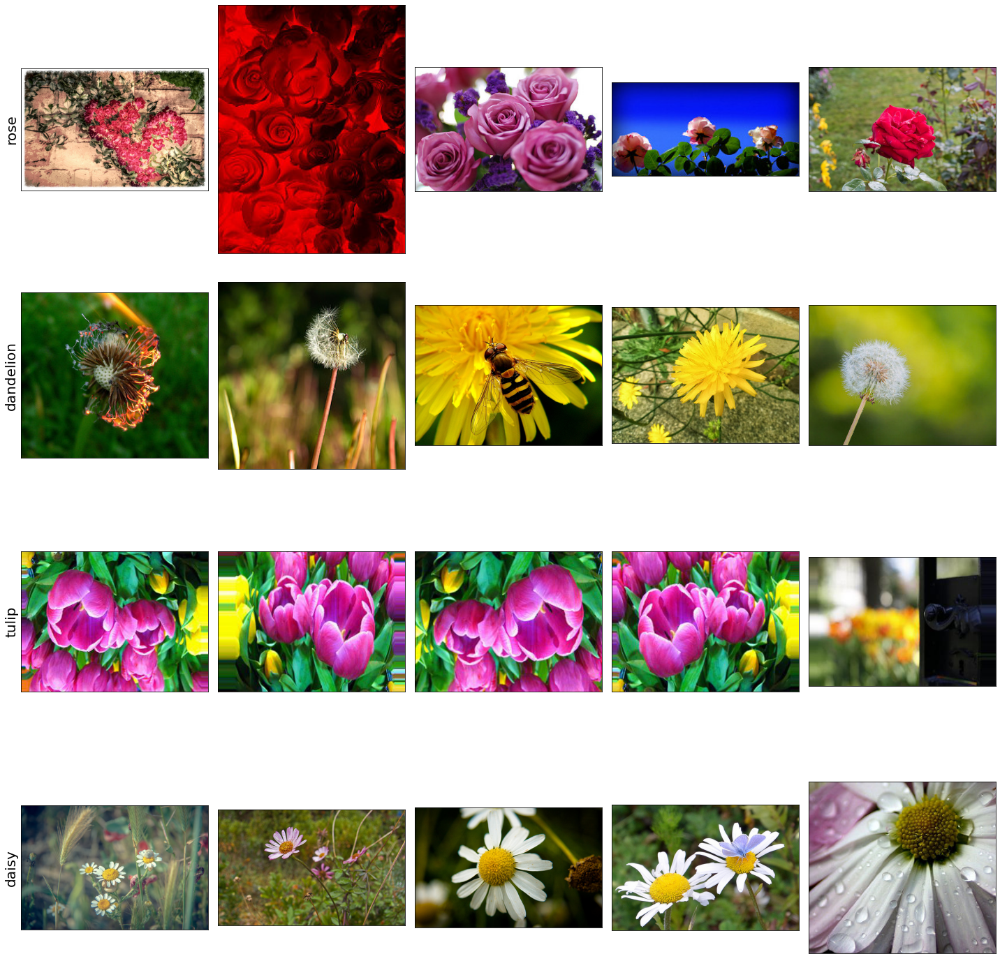

In [9]:
plt.figure(figsize=(20,20),facecolor='white')


for i in range(4):
    directory = os.path.join(main_path, labels[i])
    for j in range(5):
        path = os.path.join(directory, os.listdir(directory)[j])
        img = mpimg.imread(path)
        
        plt.subplot(4, 5, i*5 + j + 1)
        plt.imshow(img)
        
        if j == 0:
            plt.ylabel(labels[i], fontsize=20)
        
plt.setp(plt.gcf().get_axes(), xticks=[], yticks=[])
plt.tight_layout()
plt.show()

Above are examples of the flowers in the dataset where the plot is divided into four sections/labels of rose, dandelion, tulip and daisy.

# Data Preprocessing 

## Splitting the dataset

In this section I will be splitting the dataset into target, train, validation and test.

Train Size :  (2762, 2)


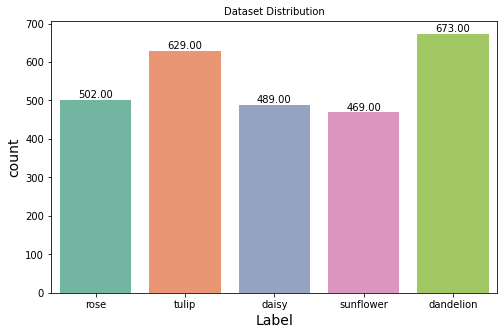

Validation Size:  (691, 2)


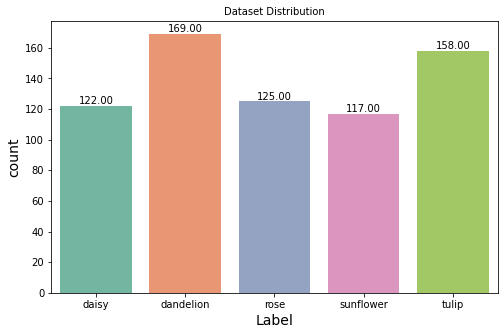

Test Size  :  (864, 2)


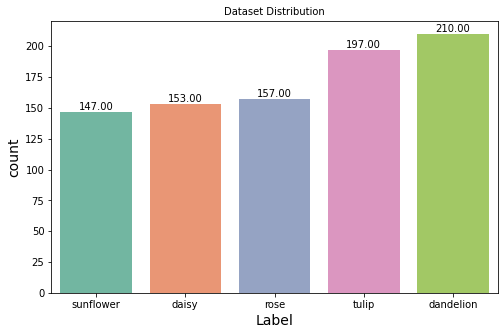

In [10]:
# defining y
y = df['label']
# Splitting training, validation and test data
df_train_full, df_test, y_train_full, y_test  = train_test_split(df,y, test_size=0.2, random_state=42,stratify=y)
df_train, df_val,y_train,y_val = train_test_split(df_train_full,y_train_full, test_size=0.2, random_state=43,stratify=y_train_full)

print('Train Size : ', df_train.shape)
visualize_data(df_train, 'Dataset')
print('Validation Size: ', df_val.shape)
visualize_data(df_val, 'Dataset')
print('Test Size  : ', df_test.shape)
visualize_data(df_test, 'Dataset')

## Augmentation of the Data

In this section I will be conducting the augmentation of the images inside the data. This is aimed to make the model learn the images better.

In [11]:
seed_num = 19
img_width = 224
img_height = 224
batch_num = 256

In [12]:
# augmenting image data
train_aug = ImageDataGenerator(
    rescale=1./255,
    rotation_range=0.2,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
)

val_aug = ImageDataGenerator(rescale=1./255)
test_aug = ImageDataGenerator(rescale=1./255)

# Model Definition

In [14]:
df_train_aug = train_aug.flow_from_dataframe(
    dataframe=df_train,
    x_col='images',
    y_col='label',
    target_size=(img_height, img_width),
    class_mode='categorical',
    batch_size=batch_num,
    shuffle=True,
    seed=seed_num)

df_val_aug = val_aug.flow_from_dataframe(
    dataframe=df_val,
    x_col='images',
    y_col='label',
    target_size=(img_height, img_width),
    class_mode='categorical',
    batch_size=batch_num,
    shuffle=False,
    seed=seed_num)

df_test_aug = test_aug.flow_from_dataframe(
    dataframe=df_test,
    x_col='images',
    y_col='label',
    target_size=(img_height, img_width),
    class_mode='categorical',
    batch_size=batch_num,
    shuffle=False,
    seed=seed_num)

Found 2762 validated image filenames belonging to 5 classes.
Found 691 validated image filenames belonging to 5 classes.
Found 864 validated image filenames belonging to 5 classes.


In [15]:
model2 = Sequential([
    layers.InputLayer(input_shape=(img_height,img_width, 3)),
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(5, activation='softmax')
])
model2.compile(optimizer='adam',
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])


After I define the model which I will be using, Sequential, I will also define the callbacks which is used for early stopping the running of the model.

In [18]:
class myCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    # Check accuracy
    if(logs.get('val_loss') < 0.2) and (logs.get('acc') > 0.8):
      # Stop if threshold is met
      print("\nValidation Loss is lower than 0.2 and Validation Accuracy is higher than 0.75 so cancelling training!")
      self.model.stop_training = True
# Instantiate class
callbacks = myCallback()



In [24]:
model2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 224, 224, 16)      448       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 112, 112, 16)     0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 112, 112, 32)      4640      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 56, 56, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 56, 56, 64)        18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 28, 28, 64)      

# Model Training

In this section, I will be training the model that I have defined in the previous section. 

In [25]:
epochs=20

history = model2.fit(
    df_train_aug,
    validation_data=df_val_aug,
    epochs=epochs,
    callbacks=callbacks
)

Epoch 1/20
11/11 [==============================] - 210s 20s/step - loss: 1.6938 - accuracy: 0.2527 - val_loss: 1.5139 - val_accuracy: 0.2938
Epoch 2/20
11/11 [==============================] - 52s 5s/step - loss: 1.3854 - accuracy: 0.3928 - val_loss: 1.3626 - val_accuracy: 0.4414
Epoch 3/20
11/11 [==============================] - 53s 5s/step - loss: 1.2116 - accuracy: 0.4986 - val_loss: 1.1814 - val_accuracy: 0.5224
Epoch 4/20
11/11 [==============================] - 53s 5s/step - loss: 1.1418 - accuracy: 0.5344 - val_loss: 1.2012 - val_accuracy: 0.5658
Epoch 5/20
11/11 [==============================] - 53s 5s/step - loss: 1.0758 - accuracy: 0.5825 - val_loss: 1.1076 - val_accuracy: 0.5847
Epoch 6/20
11/11 [==============================] - 53s 5s/step - loss: 1.0312 - accuracy: 0.5963 - val_loss: 1.0244 - val_accuracy: 0.6020
Epoch 7/20
11/11 [==============================] - 53s 5s/step - loss: 0.9939 - accuracy: 0.6231 - val_loss: 0.9712 - val_accuracy: 0.6208
Epoch 8/20
11/11 [

We can see that this model has the accuracy of 0.71, with the loss of 0.76, meaning that the loss is still greater than that of the accuracy.

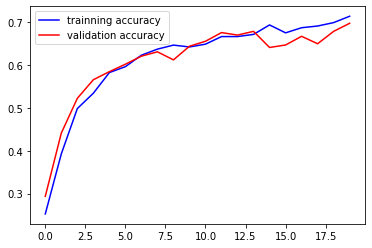

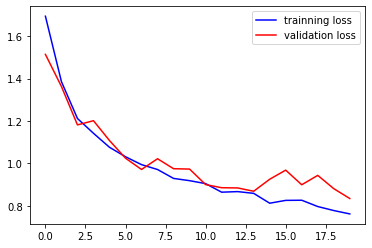

In [26]:
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(accuracy))

plt.plot(epochs, accuracy, "b", label="trainning accuracy")
plt.plot(epochs, val_accuracy, "r", label="validation accuracy")
plt.legend()
plt.show()

plt.plot(epochs, loss, "b", label="trainning loss")
plt.plot(epochs, val_loss, "r", label="validation loss")
plt.legend()
plt.show()

Although the model doesn't have exploding gradient, yet I will still be conducting the model improvement with means of increasing the accuracy of the model. 

# Model Improvement

In this section I will be conducting model improvement from the previous model with the aim of increasing the evaluation score

In [30]:
model3 = Sequential([
    layers.InputLayer(input_shape=(img_height,img_width, 3)),
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(5, activation='softmax')
])
model3.compile(optimizer='adam',
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])


I will change the epochs of the model to 50 in hopes to improve the accuracy of the model. 

In [31]:
epochs=50

history2 = model3.fit(
    df_train_aug,
    validation_data=df_val_aug,
    epochs=epochs,
    callbacks=callbacks
)

Epoch 1/50
11/11 [==============================] - 54s 5s/step - loss: 1.8039 - accuracy: 0.2723 - val_loss: 1.4220 - val_accuracy: 0.3140
Epoch 2/50
11/11 [==============================] - 52s 5s/step - loss: 1.3632 - accuracy: 0.3888 - val_loss: 1.2953 - val_accuracy: 0.4342
Epoch 3/50
11/11 [==============================] - 53s 5s/step - loss: 1.2676 - accuracy: 0.4699 - val_loss: 1.2397 - val_accuracy: 0.4370
Epoch 4/50
11/11 [==============================] - 53s 5s/step - loss: 1.1872 - accuracy: 0.4957 - val_loss: 1.1266 - val_accuracy: 0.5412
Epoch 5/50
11/11 [==============================] - 53s 5s/step - loss: 1.1149 - accuracy: 0.5543 - val_loss: 1.1749 - val_accuracy: 0.5456
Epoch 6/50
11/11 [==============================] - 53s 5s/step - loss: 1.0446 - accuracy: 0.5880 - val_loss: 1.0629 - val_accuracy: 0.6107
Epoch 7/50
11/11 [==============================] - 52s 5s/step - loss: 0.9961 - accuracy: 0.5970 - val_loss: 1.0614 - val_accuracy: 0.6035
Epoch 8/50
11/11 [==

From this improved model, we can see that the loss decreases quite significantly and the accuracy significantly increases to 0.78.

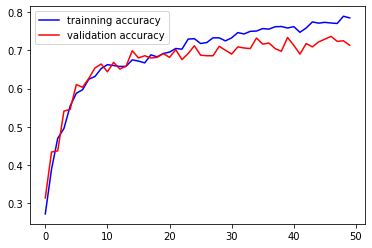

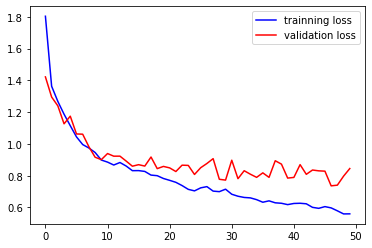

In [32]:
accuracy = history2.history['accuracy']
val_accuracy = history2.history['val_accuracy']
loss = history2.history['loss']
val_loss = history2.history['val_loss']
epochs = range(len(accuracy))

plt.plot(epochs, accuracy, "b", label="trainning accuracy")
plt.plot(epochs, val_accuracy, "r", label="validation accuracy")
plt.legend()
plt.show()

plt.plot(epochs, loss, "b", label="trainning loss")
plt.plot(epochs, val_loss, "r", label="validation loss")
plt.legend()
plt.show()

In [33]:
model3.trainable=False

In [34]:
# Evaluating result of the final model
result_func= model3.evaluate(df_train_aug)
print('Train - Loss     : ', result_func[0])
print('Train - Accuracy : ', result_func[1])
print('')

result_func= model3.evaluate(df_val_aug)
print('val - Loss     : ', result_func[0])
print('val - Accuracy : ', result_func[1])
print('')

result_func= model3.evaluate(df_test_aug)
print('Test - Loss     : ', result_func[0])
print('Test - Accuracy : ', result_func[1])
print('')

11/11 [==============================] - 40s 4s/step - loss: 0.5318 - accuracy: 0.7954
Train - Loss     :  0.531777024269104
Train - Accuracy :  0.7954381108283997

3/3 [==============================] - 4s 1s/step - loss: 0.8451 - accuracy: 0.7135
val - Loss     :  0.8450983166694641
val - Accuracy :  0.713458776473999

4/4 [==============================] - 102s 34s/step - loss: 0.8474 - accuracy: 0.6991
Test - Loss     :  0.8473802208900452
Test - Accuracy :  0.6990740895271301



In [35]:
model2.trainable = False

In [36]:
# Evaluating result of the final model
result_func= model2.evaluate(df_train_aug)
print('Train - Loss     : ', result_func[0])
print('Train - Accuracy : ', result_func[1])
print('')

result_func= model2.evaluate(df_val_aug)
print('val - Loss     : ', result_func[0])
print('val - Accuracy : ', result_func[1])
print('')

result_func= model2.evaluate(df_test_aug)
print('Test - Loss     : ', result_func[0])
print('Test - Accuracy : ', result_func[1])
print('')

11/11 [==============================] - 41s 4s/step - loss: 0.7406 - accuracy: 0.7111
Train - Loss     :  0.7406097054481506
Train - Accuracy :  0.711078941822052

3/3 [==============================] - 4s 1s/step - loss: 0.8342 - accuracy: 0.6975
val - Loss     :  0.8341909646987915
val - Accuracy :  0.6975398063659668

4/4 [==============================] - 4s 1s/step - loss: 0.8335 - accuracy: 0.6678
Test - Loss     :  0.8335068225860596
Test - Accuracy :  0.6678240895271301



We can see that the improved model (model3) has better accuracy score, I will be using that model. 

# Model Saving

In [37]:
model3.save('flower_model.h5')

# Model Inference

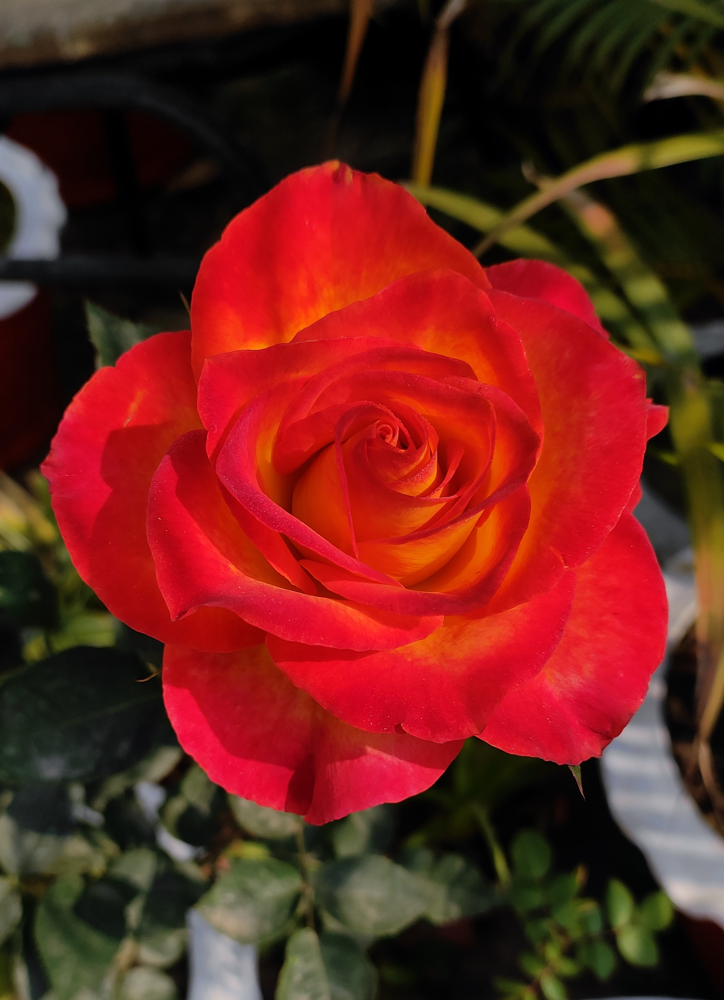

In [42]:
img = Image.open('/Garden_roses_(yellow-red).jpg')
img

In [43]:
img = np.array(img)

In [44]:
img_rescale = img/255

In [45]:
img_resize = cv2.resize(img_rescale, (224, 224))

In [46]:
df_test_aug.class_indices

{'daisy': 0, 'dandelion': 1, 'rose': 2, 'sunflower': 3, 'tulip': 4}

In [48]:
inf = model3.predict(np.array([img_resize]))
print(np.argmax(inf))

1/1 [==============================] - 0s 134ms/step
2


The model can predict that the image is rose.

# Conclusion

I used the sequential model to predict the images of the flowers where the models that I have built still needs further improvement such as: changing the type of the model, the activation, and other parameters. 

The data itself is balanced so it doesn't need balancing, but it needs to be encoded to gain further stability in